In [1]:
import cst.results
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [2]:
folder_path = 'D:\CSTStudioFiles\DualModeResonator\optimization_coupling_region_4'
iteration_num = 12
f0 = 1.03 # GHz

In [3]:
# Benchmark results
project_bm = cst.results.ProjectFile(f"D:\CSTStudioFiles\DualModeResonator\\results_from_paper_no_load\paper_results_no_load.cst", allow_interactive=True)
s11_db_bm = 20*np.log10(np.abs(project_bm.get_3d().get_result_item(r"1D Results\S-Parameters\S1,1").get_ydata()))
s12_db_bm = 20*np.log10(np.abs(project_bm.get_3d().get_result_item(r"1D Results\S-Parameters\S1,2").get_ydata()))
s21_db_bm = 20*np.log10(np.abs(project_bm.get_3d().get_result_item(r"1D Results\S-Parameters\S2,1").get_ydata()))
s22_db_bm = 20*np.log10(np.abs(project_bm.get_3d().get_result_item(r"1D Results\S-Parameters\S2,2").get_ydata()))

In [4]:
project = cst.results.ProjectFile(f"{folder_path}\iteration_0\iteration_0.cst")
x = project.get_3d().get_result_item(r"1D Results\S-Parameters\S1,1").get_xdata()

s11, s11_abs, s11_db = [], [], []
s12, s12_abs, s12_db = [], [], []
s21, s21_abs, s21_db = [], [], []
s22, s22_abs, s22_db = [], [], []

for i in range(iteration_num+1):
    project = cst.results.ProjectFile(f"{folder_path}\iteration_{i}\iteration_{i}.cst", allow_interactive=True)

    s11.append(project.get_3d().get_result_item(r"1D Results\S-Parameters\S1,1").get_ydata())
    s12.append(project.get_3d().get_result_item(r"1D Results\S-Parameters\S1,2").get_ydata())
    s21.append(project.get_3d().get_result_item(r"1D Results\S-Parameters\S2,1").get_ydata())
    s22.append(project.get_3d().get_result_item(r"1D Results\S-Parameters\S2,2").get_ydata())

    s11_abs.append(np.abs(s11[-1]))
    s12_abs.append(np.abs(s12[-1]))
    s21_abs.append(np.abs(s21[-1]))
    s22_abs.append(np.abs(s22[-1]))

    s11_db.append(20*np.log10(s11_abs[-1]))
    s12_db.append(20*np.log10(s12_abs[-1]))
    s21_db.append(20*np.log10(s21_abs[-1]))
    s22_db.append(20*np.log10(s22_abs[-1]))

You are working in interactive mode.
You are working in interactive mode.
You are working in interactive mode.
You are working in interactive mode.
You are working in interactive mode.
You are working in interactive mode.
You are working in interactive mode.
You are working in interactive mode.


### Plot S11

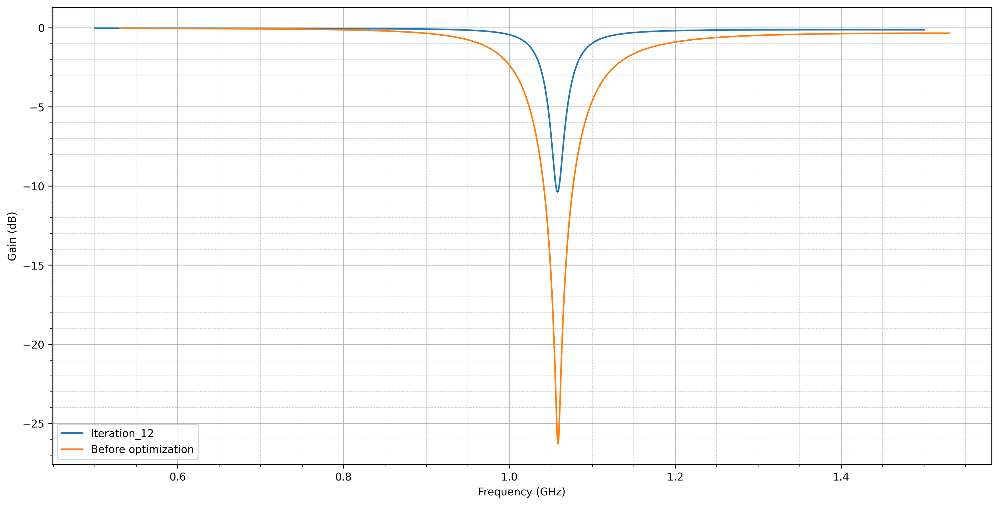

In [5]:
plt.figure(figsize=(16,8), dpi=300)

plt.plot(x, s11_db[-1], label=f'Iteration_{iteration_num}')
plt.plot(np.array(x)+0.03, s11_db_bm, label='Before optimization')

plt.xlabel(f'Frequency (GHz)')
plt.ylabel(f'Gain (dB)')
plt.legend()

plt.grid(which='major', linestyle='-', linewidth=0.8, alpha=0.9)  # Major grid
plt.grid(which='minor', linestyle='--', linewidth=0.5, alpha=0.6)  # Minor grid
plt.minorticks_on()  # Enable minor ticks on both axes

plt.show()

In [6]:
fig, ax = plt.subplots(figsize=(16, 8), dpi=300)
line, = ax.plot([], [], label='Iteration 0', alpha=0.1)

ax.set_xlabel('Frequency (GHz)')
ax.set_ylabel('Gain (dB)')
ax.set_xlim(np.min(x), np.max(x))
ax.set_ylim(np.min(s11_db)-5, 0)  # Set y-limits based on the data

ax.grid(which='major', linestyle='-', linewidth=0.5, alpha=0.7)  # Major grid
ax.grid(which='minor', linestyle='--', linewidth=0.3, alpha=0.5)  # Minor grid
ax.minorticks_on()  # Enable minor ticks

ax.legend()

def update(frame):
    line.set_data(x, s11_db[frame])  # Update the line data
    line.set_label(f'Iteration {frame}')  # Update label
    line.set_alpha(1.0)
    ax.legend()  # Update the legend
    return [line]

animation = FuncAnimation(fig, update, frames=len(s11_db), blit=True)
plt.close(fig)

HTML(animation.to_jshtml())

# animation.save('animation.mp4', writer='ffmpeg', fps=10)  # For MP4
# animation.save('animation.gif', writer='imagemagick', fps=10)  # For GIF


### Plot S12

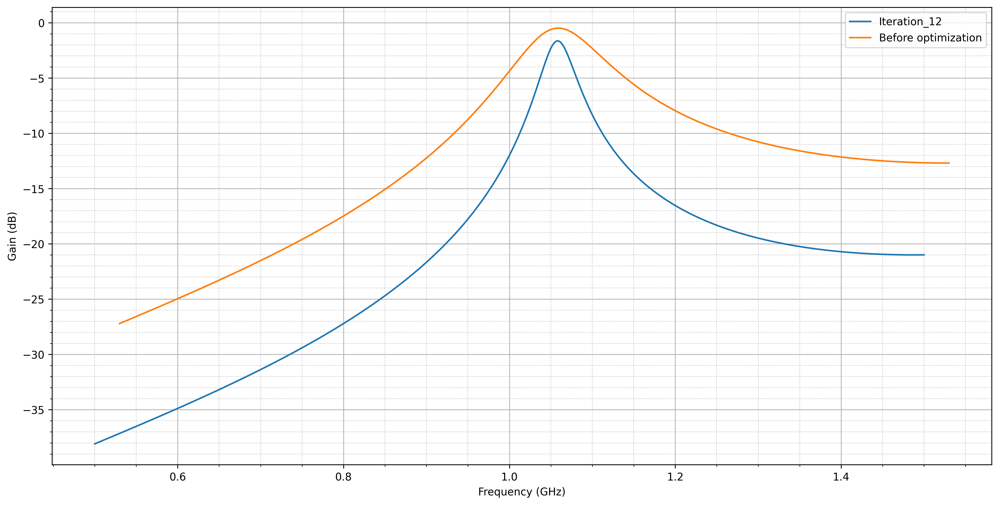

In [7]:
plt.figure(figsize=(16,8), dpi=300)

plt.plot(x, s12_db[-1], label=f'Iteration_{iteration_num}')
plt.plot(np.array(x)+0.03, s12_db_bm, label='Before optimization')

plt.xlabel(f'Frequency (GHz)')
plt.ylabel(f'Gain (dB)')
plt.legend()

plt.grid(which='major', linestyle='-', linewidth=0.8, alpha=0.9)  # Major grid
plt.grid(which='minor', linestyle='--', linewidth=0.5, alpha=0.6)  # Minor grid
plt.minorticks_on()  # Enable minor ticks on both axes

plt.show()

In [8]:
fig, ax = plt.subplots(figsize=(16, 8), dpi=300)
line, = ax.plot([], [], label='Iteration 0', alpha=0.1)

ax.set_xlabel('Frequency (GHz)')
ax.set_ylabel('Gain (dB)')
ax.set_xlim(np.min(x), np.max(x))
ax.set_ylim(np.min(s12_db)-5, 0)  # Set y-limits based on the data

ax.grid(which='major', linestyle='-', linewidth=0.5, alpha=0.7)  # Major grid
ax.grid(which='minor', linestyle='--', linewidth=0.3, alpha=0.5)  # Minor grid
ax.minorticks_on()  # Enable minor ticks

ax.legend()

def update(frame):
    line.set_data(x, s12_db[frame])  # Update the line data
    line.set_label(f'Iteration {frame}')  # Update label
    line.set_alpha(1.0)
    ax.legend()  # Update the legend
    return [line]

animation = FuncAnimation(fig, update, frames=len(s11_db), blit=True)
plt.close(fig)

HTML(animation.to_jshtml())

# animation.save('animation.mp4', writer='ffmpeg', fps=10)  # For MP4
# animation.save('animation.gif', writer='imagemagick', fps=10)  # For GIF


### Plot S21

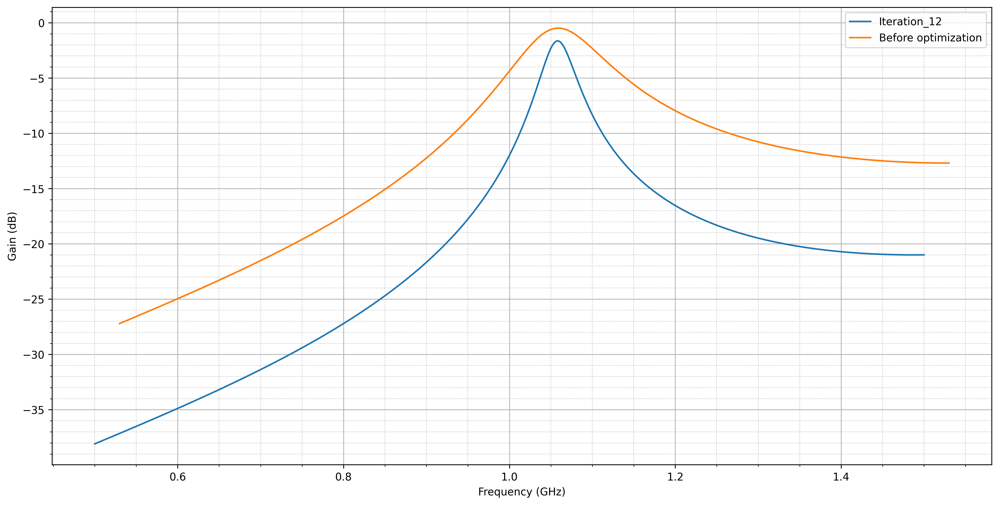

In [9]:
plt.figure(figsize=(16,8), dpi=300)

plt.plot(x, s21_db[-1], label=f'Iteration_{iteration_num}')
plt.plot(np.array(x)+0.03, s21_db_bm, label='Before optimization')

plt.xlabel(f'Frequency (GHz)')
plt.ylabel(f'Gain (dB)')
plt.legend()

plt.grid(which='major', linestyle='-', linewidth=0.8, alpha=0.9)  # Major grid
plt.grid(which='minor', linestyle='--', linewidth=0.5, alpha=0.6)  # Minor grid
plt.minorticks_on()  # Enable minor ticks on both axes

plt.show()

In [10]:
fig, ax = plt.subplots(figsize=(16, 8), dpi=300)
line, = ax.plot([], [], label='Iteration 0', alpha=0.1)

ax.set_xlabel('Frequency (GHz)')
ax.set_ylabel('Gain (dB)')
ax.set_xlim(np.min(x), np.max(x))
ax.set_ylim(np.min(s21_db)-5, 0)  # Set y-limits based on the data

ax.grid(which='major', linestyle='-', linewidth=0.5, alpha=0.7)  # Major grid
ax.grid(which='minor', linestyle='--', linewidth=0.3, alpha=0.5)  # Minor grid
ax.minorticks_on()  # Enable minor ticks

ax.legend()

def update(frame):
    line.set_data(x, s21_db[frame])  # Update the line data
    line.set_label(f'Iteration {frame}')  # Update label
    line.set_alpha(1.0)
    ax.legend()  # Update the legend
    return [line]

animation = FuncAnimation(fig, update, frames=len(s21_db), blit=True)
plt.close(fig)

HTML(animation.to_jshtml())

# animation.save('animation.mp4', writer='ffmpeg', fps=10)  # For MP4
# animation.save('animation.gif', writer='imagemagick', fps=10)  # For GIF


### Plot S22

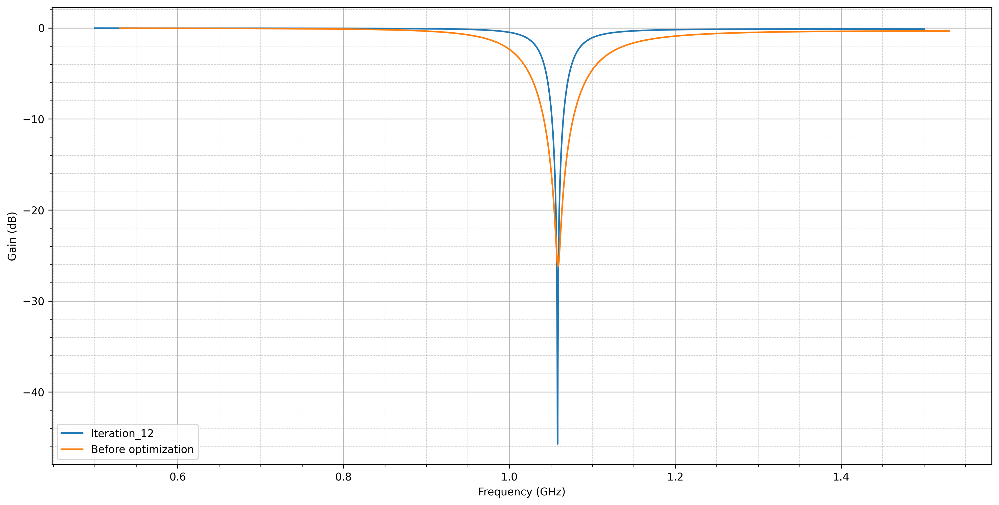

In [11]:
plt.figure(figsize=(16,8), dpi=300)

plt.plot(x, s22_db[-1], label=f'Iteration_{iteration_num}')
plt.plot(np.array(x)+0.03, s22_db_bm, label='Before optimization')

plt.xlabel(f'Frequency (GHz)')
plt.ylabel(f'Gain (dB)')
plt.legend()

plt.grid(which='major', linestyle='-', linewidth=0.8, alpha=0.9)  # Major grid
plt.grid(which='minor', linestyle='--', linewidth=0.5, alpha=0.6)  # Minor grid
plt.minorticks_on()  # Enable minor ticks on both axes

plt.show()

In [12]:
fig, ax = plt.subplots(figsize=(16, 8), dpi=300)
line, = ax.plot([], [], label='Iteration 0', alpha=0.1)

ax.set_xlabel('Frequency (GHz)')
ax.set_ylabel('Gain (dB)')
ax.set_xlim(np.min(x), np.max(x))
ax.set_ylim(np.min(s22_db)-5, 0)  # Set y-limits based on the data

ax.grid(which='major', linestyle='-', linewidth=0.5, alpha=0.7)  # Major grid
ax.grid(which='minor', linestyle='--', linewidth=0.3, alpha=0.5)  # Minor grid
ax.minorticks_on()  # Enable minor ticks

ax.legend()

def update(frame):
    line.set_data(x, s22_db[frame])  # Update the line data
    line.set_label(f'Iteration {frame}')  # Update label
    line.set_alpha(1.0)
    ax.legend()  # Update the legend
    return [line]

animation = FuncAnimation(fig, update, frames=len(s22_db), blit=True)
plt.close(fig)

HTML(animation.to_jshtml())

# animation.save('animation.mp4', writer='ffmpeg', fps=10)  # For MP4
# animation.save('animation.gif', writer='imagemagick', fps=10)  # For GIF
